<div align="right">Python 3.6 Jupyter Notebook</div>

# Network analysis using NetworkX

<div class="alert alert-warning">
<b>This notebook contains advanced exercises that will help you deepen your understanding of Network Analysis.</b> You will be able to achieve 100% for this notebook by successfully completing Exercises 1, 2, 3, 4, 5, 6, and 7.</div>


### Your completion of the notebook exercises will be graded based on your ability to do the following:
 
> **Understand**: Do your pseudo-code and comments show evidence that you recall and understand technical concepts?

> **Apply**: Are you able to execute code (using the supplied examples) that performs the required functionality on supplied or generated data sets? 

> **Analyze**: Are you able to pick the relevant method or library to resolve specific stated questions?

> **Evaluate**: Are you able to interpret the results and justify your interpretation based on the observed data?


#### Notebook objectives
By the end of this notebook, you will be expected to:
> 
  - Prepare a data set for graph analysis, using NetworkX;
  - Evaluate and compare structural properties of a graph object;
  - Interpret what information the structural properties provide in the physical world; and
  - Develop a basic understanding of small-world networks.
  
####  List of exercises:
> **Exercise 1**: Compute the number of call interactions between a pair of nodes.

>**Exercise 2**: Evaluate structure qualitatively in a graph based on visualization.

>**Exercise 3**: Create a graph object using the SMS data set.

>**Exercise 4 [Advanced]**: Compare the centrality structural properties evaluated on a graph.

>**Exercise 5**: Describe the effect on the average clustering coefficient when nodes of lower degree are removed.

>**Exercise 6**: List the two criteria of a small-world network.

>**Exercise 7**: Identify small-world networks, given the values for the characteristic path length and clustering coefficient.

# Notebook introduction 

<img src="./img/social_network_analysis.png" width=350 height=350>

The use of phone logs to infer relationships between volume of communication and other parameters has been an area of major research interest. In his seminal paper,  which was the first application of phone logs, George Kingsley Zipf (1949) investigated the influence of distance on communication. Many studies have since followed. Big data is characterized by significant increases in structured and unstructured data generated by mobile phones that are sampled and captured at high velocities. Its emergence, and the availability of computer processing technologies that are able to store and process these data sets efficiently, has made it possible to expand these studies in order to improve our understanding of human behavior with unprecedented resolution. Mobile phone data allows the inference of real social networks using call detail records, or CDRs (i.e., phone calls, short message service (SMS) and multimedia message (MMS) communications). These records are combined with GPS and WiFi datasets, browsing habits, application logs, and tower data to reveal a superposition of several social actors.

According to Blondel et al. (2015):

> *The mobile nature of a mobile phone brings two advantages: first, the temporal patterns of communications [are] reflected in great detail due to the fact that the owner of the device usually carries the device with them and therefore the possibility of receiving the call exists in almost all cases, and second, the positioning data of a mobile phone allows tracking the displacements of its owner*.

Unlike self-reported surveys – which are often subjective, limited to a very small subset of the population, and have been the only avenue used to gather data in the past – mobile phone CDRs contain information on verifiable communications between millions of people at a time. Further enrichment from geolocation data, which invariably is also collected alongside CDRs, as well as other external data that is available for the target segment (typically demographics), makes mobile phone CDRs an extremely rich and informative source of data for scientists and analysts. 

These interactions via mobile phones can be represented by a large network where nodes represent individuals, and links are drawn between individuals that have had a phone call, or exchanged messages or other media. 

The study of the structure of such networks provides useful insights into their organization, and can assist in improving communication infrastructure, understanding human behavior, traffic planning, and marketing initiatives, among others. According to Gautier Krings (2012), these applications are informed by the extraction and analysis of different kinds of information from large networks, including the following:

1. **Associating every node with geographical coordinates.** This can facilitate how geography influences the creation of links. More specifically, the intensity of communication between nodes decreases as a power of the geographical distance that separates them.

2. **Studying how links in networks change over time (i.e., dynamical networks).** In these networks, new nodes enter or leave the network and the strength of their connections rise and wane during the observation period. Of particular interest is the influence of time scales on the emergence of different structural properties of dynamical networks.

3. **Detecting communities in networks.** Communities are groups of nodes that are densely connected to each other. 



**Load libraries and set global parameters for Matplotlib**

In [1]:
# Load the relevant libraries to your notebook. 
import pandas as pd
import networkx as nx
import matplotlib.pylab as plt 

import numpy as np       
from networkx.drawing.nx_agraph import graphviz_layout
import graphviz
import pygraphviz
import random
from IPython.display import Image, display
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

# Set global parameters for plotting. 
%matplotlib inline
plt.rcParams['figure.figsize'] = (10, 8)

In [2]:
def pydot(G):
    pdot = nx.drawing.nx_pydot.to_pydot(G)
    display(Image(pdot.create_png()))

# 1. Graph structures using NetworkX
In this notebook, you will continue working with the empirical dataset from the "Friends and Family" study used in Module 2. 

### 1.1 Data preparation

As before, the first step is preparing the data for analysis. In the following, you will load the data into a DataFrame object, filter and retain the records of interest, and select the fields or data columns to use when creating graph objects.

#### 1.1.1 Load the data into a DataFrame
In this data, each record or row is typical of what is available in a CDR, i.e., the actors involved, the starting time of the interaction, the duration of the interaction, who initiated it, and who was the recipient, among other details not included here (such as the geolocation of the sender and receiver). 

In [3]:
# Read the CallLog.csv file, print the number of records loaded as well as the first 5 rows.
calls = pd.read_csv('CallLog.csv')
print('Loaded {0} rows of call log.'.format(len(calls)))
calls.head()

Loaded 164905 rows of call log.


,participantID.A,participantID.B,local_time,type,duration,number.hash
0,sp10-01-02,NaN,2010-08-04 19:11:51,outgoing+,NaN,da83375fb3a7631f304a9471add44eeb19d3355
1,sp10-01-02,NaN,2010-08-04 18:49:26,outgoing+,NaN,da83375fb3a7631f304a9471add44eeb19d3355
2,sp10-01-53,sp10-01-04,2010-07-10 19:24:25,outgoing+,NaN,e729a096a6c30c9f523e56329b4cdc7993d83b00
3,sp10-01-53,sp10-01-04,2010-07-10 19:24:17,outgoing+,NaN,e729a096a6c30c9f523e56329b4cdc7993d83b00
4,sp10-01-53,NaN,2010-07-15 18:04:23,incoming+,NaN,ec5be5bbb1a719fc8c348ebbc577b99a61457575


#### 1.1.2 Row filtering

In the data set, there are calls to outsiders that can be seen in each entry where the participant's ID is "`NaN`". These are not relevant to the current exercise and need to be removed before you proceed. Remove all calls where one of the participant IDs is missing. First, check the number of records in your DataFrame using Pandas's [shape  DataFrame method](http://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.shape.html).

In [4]:
# Initial number of records.
calls.shape[0]

164905

Next, review the data using the ``info()`` method.

In [5]:
calls.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 164905 entries, 0 to 164904
Data columns (total 6 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   participantID.A  164905 non-null  object 
 1   participantID.B  60518 non-null   object 
 2   local_time       164905 non-null  object 
 3   type             164904 non-null  object 
 4   duration         59124 non-null   float64
 5   number.hash      164905 non-null  object 
dtypes: float64(1), object(5)
memory usage: 7.5+ MB


Next, you will clean the data by removing interactions involving outsiders as discussed above. Removing missing values is very common in data analysis, and Pandas has a convenient method, appropriately named [dropna()](http://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.dropna.html), designed to automate this cleaning process.

In [6]:
# Drop rows with NaN in either of the participant ID columns.
calls = calls.dropna(subset = ['participantID.A', 'participantID.B'])
print('{} rows remaining after dropping missing values from selected columns.'.format(len(calls)))
calls.head(n=5)

60518 rows remaining after dropping missing values from selected columns.


,participantID.A,participantID.B,local_time,type,duration,number.hash
2,sp10-01-53,sp10-01-04,2010-07-10 19:24:25,outgoing+,NaN,e729a096a6c30c9f523e56329b4cdc7993d83b00
3,sp10-01-53,sp10-01-04,2010-07-10 19:24:17,outgoing+,NaN,e729a096a6c30c9f523e56329b4cdc7993d83b00
6,sp10-01-53,sp10-01-52,2010-07-20 19:25:54,outgoing+,NaN,e22a3263eb0280fa601c400bc87e178a9ac5d3f7
26,sp10-01-01,sp10-01-53,2010-07-23 19:06:01,outgoing+,NaN,627e38ee55f5373a9bb5133558d623d7b8fe8ff6
29,sp10-01-01,sp10-01-02,2010-07-23 18:51:17,incoming+,NaN,6db007cb74cc8537b99e7d230c0452f4ba71d13e


#### 1.1.3 Column selection

For the purpose of this study, you should only focus on the social actors involved in the call interaction. Therefore, you can remove all columns not relevant to the network being analyzed.

In [7]:
# Create a new object containing only the columns of interest.
interactions = calls[['participantID.A', 'participantID.B']]

Finally, exclude rows where the actors are the same.

In [8]:
# Get a list of rows with different participants.
row_with_different_participants = interactions['participantID.A'] != interactions['participantID.B']

# Update "interactions" to contain only the rows identified. 
interactions = interactions.loc[row_with_different_participants,:]
interactions.head()

,participantID.A,participantID.B
2,sp10-01-53,sp10-01-04
3,sp10-01-53,sp10-01-04
6,sp10-01-53,sp10-01-52
26,sp10-01-01,sp10-01-53
29,sp10-01-01,sp10-01-02


### 1.2 Creating graph objects with NetworkX
The call interactions captured above are directed, meaning that edges (u,v) and (v,u) are different.

First, let's try to capture the number of interactions between social actors, irrespective of who initiated the call. This will be done using an undirected graph. You will need to capture the number of interactions between any pair of actors with a link in the graph. Therefore, the graph object that needs to be created is a weighted undirected graph.

Using a Pandas DataFrame object as direct input into NetworkX to create graphs,  the following demonstration illustrates how to build an unweighted and undirected graph.

In [9]:
# Create an unweighted undirected graph using the NetworkX's from_pandas_edgelist method.
# The column participantID.A is used as the source and participantID.B as the target.
G = nx.from_pandas_edgelist(interactions, 
                             source='participantID.A', 
                             target='participantID.B', 
                             create_using=nx.Graph())

Review basic information on your graph.

In [10]:
# Print the number of nodes in our network.
print('The undirected graph object G has {0} nodes.'.format(G.number_of_nodes()))

# Print the number of edges in our network.
print('The undirected graph object G has {0} edges.'.format(G.number_of_edges()))

The undirected graph object G has 129 nodes.
The undirected graph object G has 392 edges.


In the following cells, the neighbors for five of the nodes are saved in Python dict, with the node label as key, and then printed.

In [11]:
# Declare a variable for number of nodes to get neighbors of.
max_nodes = 5

In [12]:
# Variable initialization.
count = 0
ndict = {}

# Loop through G and get a node's neigbours, store in ndict. Do this for a maximum of 'max_nodes' nodes. 
for node in list(G.nodes()):
    ndict[node] = tuple(G.neighbors(node))
    count = count + 1
    if count > max_nodes:
        break

In [13]:
print(ndict)

{'sp10-01-53': ('sp10-01-04', 'sp10-01-52', 'sp10-01-01', 'fa10-01-04', 'sp10-01-55', 'fa10-01-81', 'fa10-01-71', 'fa10-01-82', 'fa10-01-44'), 'sp10-01-04': ('sp10-01-53',), 'sp10-01-52': ('sp10-01-53', 'sp10-01-43', 'sp10-01-02', 'sp10-01-01', 'fa10-01-04', 'fa10-01-44', 'fa10-01-82', 'fa10-01-72', 'fa10-01-71', 'sp10-01-33', 'fa10-01-43', 'fa10-01-81', 'sp10-01-26'), 'sp10-01-01': ('sp10-01-53', 'sp10-01-02', 'fa10-01-04', 'sp10-01-52', 'fa10-01-81', 'fa10-01-71', 'fa10-01-82'), 'sp10-01-02': ('sp10-01-01', 'fa10-01-04', 'sp10-01-43', 'sp10-01-52', 'sp10-01-33', 'fa10-01-82', 'fa10-01-81', 'fa10-01-71'), 'sp10-01-08': ('fa10-01-04', 'sp10-01-07', 'sp10-01-38', 'sp10-01-41', 'sp10-01-49', 'sp10-01-31', 'sp10-01-39', 'sp10-01-45', 'fa10-01-30', 'sp10-01-32', 'fa10-01-13', 'fa10-01-14', 'sp10-01-48', 'sp10-01-46')}


In [14]:
# Print only the first item in the dict.
print([list(ndict)[0], ndict[list(ndict)[0]]])

['sp10-01-53', ('sp10-01-04', 'sp10-01-52', 'sp10-01-01', 'fa10-01-04', 'sp10-01-55', 'fa10-01-81', 'fa10-01-71', 'fa10-01-82', 'fa10-01-44')]


Your original objective is to create a **weighted undirected** graph for call interactions, with the weights representing the number of interactions between two distinct participants. As illustrated above, you can use the "from_pandas_dataframe" method to build an undirected graph between the pairs of actors, by specifying the graph structure using a parameter to the argument "create_using=". To get the correct weights in the undirected graph, however, you will need to add the weight information separately. Unfortunately, you cannot rely on NetworkX to do this as it cannot be used to control what data the undirected edges get. Below is a description of how to add the necessary weights to the undirected graph.

The first task is to compute the number of interactions between participants. You will use Pandas' "group_by" DataFrame method to achieve this.

In [15]:
# Get the count of interactions between participants and display the top 5 rows.
grp_interactions = pd.DataFrame(interactions.groupby(['participantID.A', 'participantID.B']).size(), 
                                columns=['counts']).reset_index()

grp_interactions.head(5)

,participantID.A,participantID.B,counts
0,fa10-01-01,fa10-01-02,870
1,fa10-01-01,fa10-01-05,1
2,fa10-01-01,fa10-01-17,3
3,fa10-01-02,fa10-01-01,1254
4,fa10-01-02,fa10-01-18,2


In [16]:
nx.to_pandas_edgelist?

Signature:
nx.to_pandas_edgelist(
    G,
    source='source',
    target='target',
    nodelist=None,
    dtype=None,
    edge_key=None,
)
Docstring:
Returns the graph edge list as a Pandas DataFrame.

Parameters
----------
G : graph
    The NetworkX graph used to construct the Pandas DataFrame.

source : str or int, optional
    A valid column name (string or integer) for the source nodes (for the
    directed case).

target : str or int, optional
    A valid column name (string or integer) for the target nodes (for the
    directed case).

nodelist : list, optional
   Use only nodes specified in nodelist

dtype : dtype, default None
    Use to create the DataFrame. Data type to force.
    Only a single dtype is allowed. If None, infer.

edge_key : str or int or None, optional (default=None)
    A valid column name (string or integer) for the edge keys (for the
    multigraph case). If None, edge keys are not stored in the DataFrame.

Returns
-------
df : Pandas DataFrame
   Graph edg

In [17]:
# Create a directed graph with an edge_attribute labeled counts.
g = nx.from_pandas_edgelist(grp_interactions, 
                             source='participantID.A', 
                             target='participantID.B', 
                             edge_attr='counts', 
                             create_using=nx.DiGraph())

Instantiate a weighted undirected graph, and populate edge information using the edges list from the directed graph.

In [18]:
# Set all the weights to 0 at this stage. We will add the correct weight information in the next step.
G = nx.Graph()
G.add_edges_from(g.edges(), counts=0)

Now, iterate through each link from the directed graph, adding the attribute weight (counts) to the corresponding link in the undirected graph.

In [19]:
for u, v, d in g.edges(data=True):
    G[u][v]['counts'] += d['counts']

Look at some of the edges and their corresponding weights.

In [20]:
# Print a sample of the edges, with corresponding attribute data.
max_number_of_edges = 5
count = 0
for n1,n2,attr in G.edges(data=True): # unpacking
    print(n1,n2,attr)
    count = count + 1
    if count > max_number_of_edges:
        break     

fa10-01-01 fa10-01-02 {'counts': 2124}
fa10-01-01 fa10-01-05 {'counts': 2}
fa10-01-01 fa10-01-17 {'counts': 3}
fa10-01-02 fa10-01-18 {'counts': 2}
fa10-01-05 fa10-01-04 {'counts': 122}
fa10-01-05 fa10-01-06 {'counts': 1208}


You can verify whether the steps you executed above have worked using the following:

In [21]:
# Verify our attribute data is correct using a selected (u,v) pair from the data.
u = 'fa10-01-77'
v = 'fa10-01-78'
print('Number of undirected call interactions between {0} and {1} is {2}.'.format(u,
                                                                    v,
                                                            G.get_edge_data(v,u)['counts']))

Number of undirected call interactions between fa10-01-77 and fa10-01-78 is 328.


In [22]:
# Compare our data set to the interactions data set.
is_uv_pair = ((interactions['participantID.A'] == u) & (interactions['participantID.B'] == v)) 
is_vu_pair = ((interactions['participantID.A'] == v) & (interactions['participantID.B'] == u))
print('Number of undirected call interactions between {0} and {1} is {2}'.format(u,
                                            v, 
                                            interactions[is_uv_pair | is_vu_pair].shape[0]))

Number of undirected call interactions between fa10-01-77 and fa10-01-78 is 328


Based on the comparison above, it can be said with confidence that your graph object captures the interactions as expected.

<br>
<div class="alert alert-info">
<b>Exercise 1 Start.</b>
</div>

### Instructions
> Calculate the number of call interactions between participant sp10-01-52 and participant fa10-01-81 captured in your graph, using any of the above approaches.


In [23]:
# Number of call interactions between participant sp10-01-52 and participant fa10-01-81.
u = 'sp10-01-52'
v = 'fa10-01-81'
print('Number of undirected call interactions between {0} and {1} is {2}.'.format(u,
                                                                  v,
                                                            G.get_edge_data(v,u)['counts']))

Number of undirected call interactions between sp10-01-52 and fa10-01-81 is 31.


In [24]:
# Compare our data set to the interactions data set.
is_uv_pair = ((interactions['participantID.A'] == u) & (interactions['participantID.B'] == v)) 
is_vu_pair = ((interactions['participantID.A'] == v) & (interactions['participantID.B'] == u))
print('Number of undirected call interactions between {0} and {1} is {2}'.format(u,
                                            v, 
                                            interactions[is_uv_pair | is_vu_pair].shape[0]))

Number of undirected call interactions between sp10-01-52 and fa10-01-81 is 31


<br>
<div class="alert alert-info">
<b>Exercise 1 End.</b>
</div>

> **Exercise complete**:
    
> This is a good time to "Save and Checkpoint".

### 1.3 Graph visualization
The next step is to visualize the graph object – a topic that you briefly touched on in Notebook 1. NetworkX is not primarily a graph drawing package, but provides basic drawing capabilities using Matplotlib. More advanced graph visualization packages can be used. However, these are outside of the scope of this course.

[NetworkX documentation](https://networkx.github.io/documentation/stable/reference/introduction.html#drawing) (2015) states:
> Proper graph visualization is hard, and we highly recommend that people visualize their graphs with tools dedicated to that task. Notable examples of dedicated and fully-featured graph visualization tools are Cytoscape, Gephi, Graphviz and, for LaTeX typesetting, PGF/TikZ.

A graph is an abstract mathematical object without a specific representation in the Cartesian coordinate space, and graph visualization is therefore not a well-defined problem with a unique solution. Depending on which structures in the graph object are of interest, several layout algorithms exist that can be used to optimize node positioning for display visualization. Whenever you want to visualize a graph, you have to find mapping from vertices to Cartesian coordinates first, preferably in a way that is aesthetically pleasing. A separate branch of graph theory, namely graph drawing, attempts to solve this problem via several graph layout algorithms.

You will use the interface provided by [Graphviz](http://graphviz.org/) for node positioning in most of your visualization in this course, because considering other possibilities may distract from the core objectives. Two node positioning algorithms can be accessed using the Graphviz interface provided by NetworkX. They are the following:
-  **dot**: "hierarchical" or layered drawings of directed graphs. This is the default to use if edges have directionality. The dot algorithm produces a ranked layout of a graph honoring edge directions. It is particularly appropriate for displaying hierarchies or directed acyclic graphs.
- **neato**: "spring model" layouts.  This is the default to use if the graph is not too large (about 100 nodes), and you don't know anything else about it. Neato attempts to minimize a global energy function, which is equivalent to statistical multidimensional scaling. An ideal spring is placed between every pair of nodes, such that its length is set to the shortest path distance between the endpoints. The springs push the nodes so their geometric distance in the layout approximates their path distance in the graph.

Below is a visual display of your weighted undirected call graph, using different visualization approaches.

#### 1.3.1 Graphviz layout using the "dot" engine

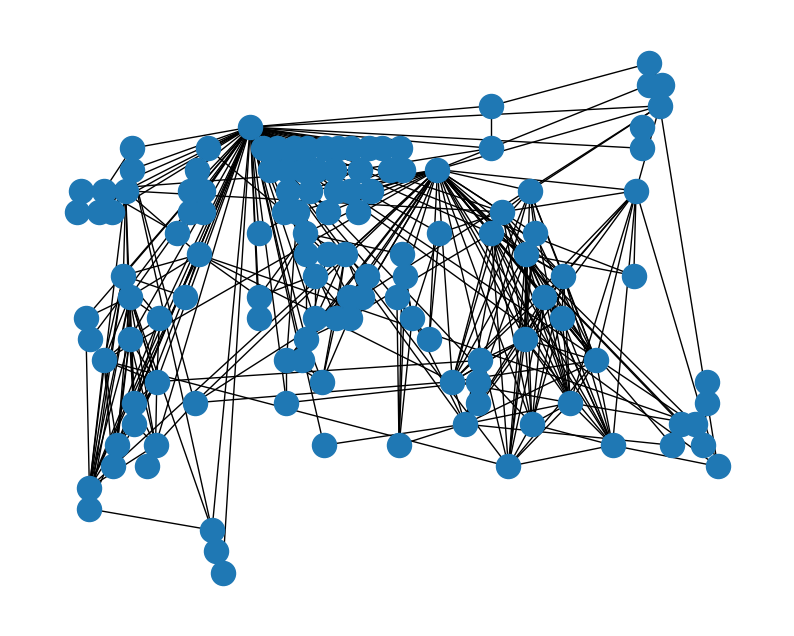

In [25]:
pos = graphviz_layout(G, prog='dot') # you can also try using the "neato" engine
nx.draw_networkx(G, pos=pos, with_labels=False)
_ = plt.axis('off')

#### 1.3.1a Graphviz layout using the "neato" engine (my own attempt)

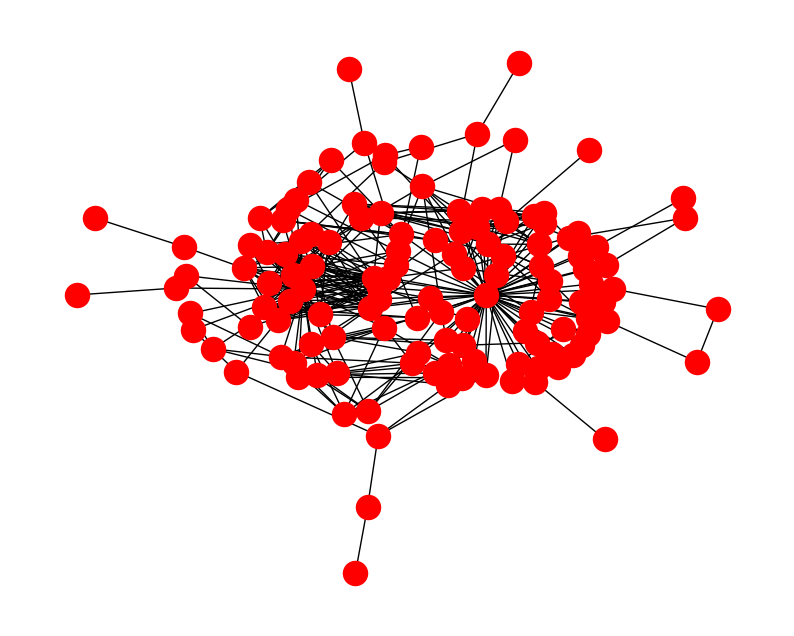

In [26]:
pos = graphviz_layout(G, prog='neato') # using the "neato" engine
nx.draw_networkx(G, pos=pos, node_color='red', with_labels=False)
_ = plt.axis('off')

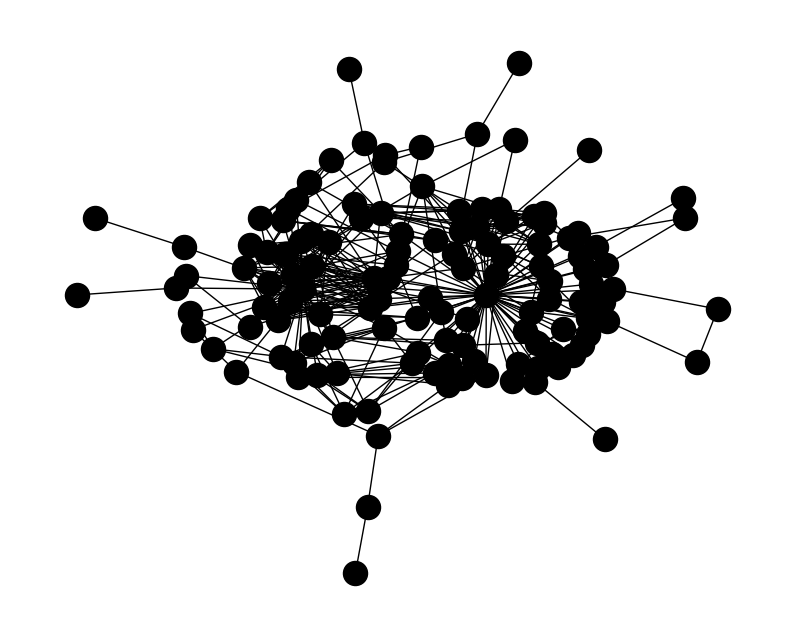

In [27]:
nx.draw_networkx(G, pos=graphviz_layout(G), node_color='black', with_labels=False)
_ = plt.axis('off')

#### 1.3.2 Graph visualization using NetworkX's in-built "spring layout"

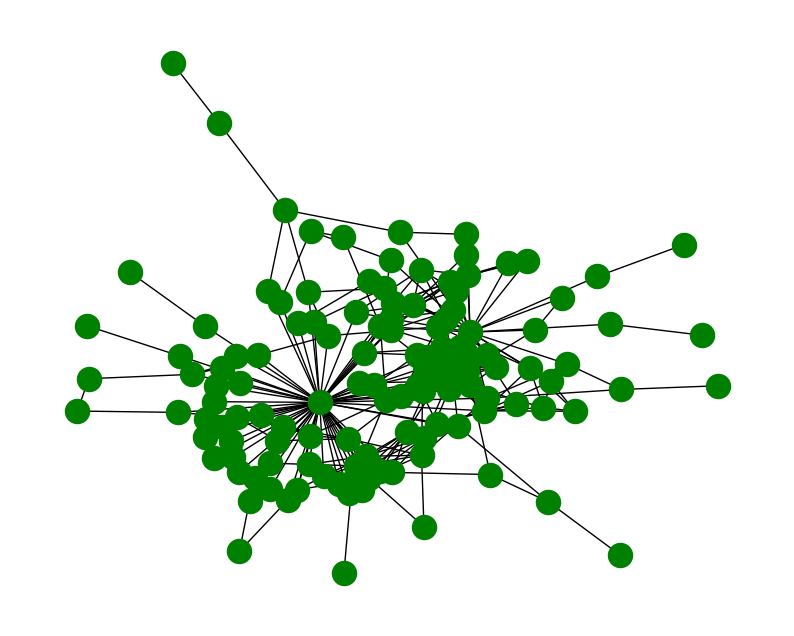

In [28]:
layout = nx.spring_layout(G)
nx.draw_networkx(G, pos=layout, node_color='green', with_labels=False)
_ = plt.axis('off')

#### 1.3.3 Graph visualization with Pydot rendering

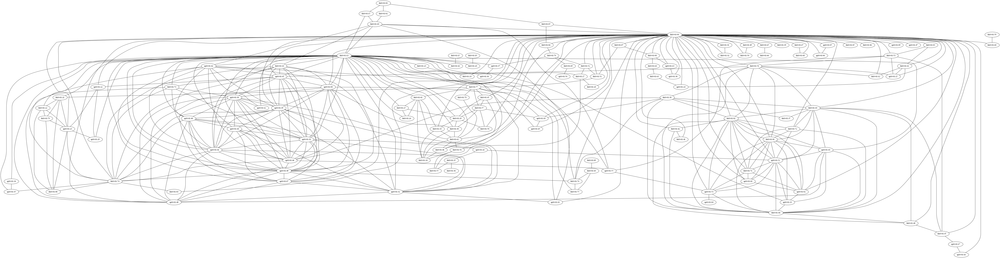

In [29]:
pydot(G)

<br>
<div class="alert alert-info">
<b>Exercise 2 Start.</b>
</div>

### Instructions 

> Based on the various visualizations explored above, what can you tell about these networks and the types of interactions they capture? Please provide written feedback (a sentence or two) based on your insights of the call log data in the markdown cell below.

> **Hint**:
- In your answer, indicate if there appears to be some structure in the graph, or if the connections between nodes appear random (i.e., do some nodes have more links than others)? Do the participants cluster into identifiable communities or not?

From the visualizations above it's evident that the call log data captures a network with edge formations, centrality variations, the presence of potential clusters or communities (particularly in the 'neato' engine visualization), and nodes connected to multiple others we can identify them as key nodes (i.e. those with the highest centrality)

<br>
<div class="alert alert-info">
<b>Exercise 2 End.</b>
</div>

> **Exercise complete**:
    
> This is a good time to "Save and Checkpoint".

<br>
<div class="alert alert-info">
<b>Exercise 3 Start.</b>
</div>

### Instructions

You will now need to reproduce the steps above for SMS records.

> 1. Load the file "SMSLog.csv" from the data folder in your home directory, into a variable "sms".
> 2. Create a weighted undirected graph using the number of interactions between participants as weights.
> 3. Assign the graph to variable "H" (do not overwrite "G" as you will still use it below).
> 4. Ignore all interactions where one of the parties is missing or unknown (i.e. "`NaN`").
> 5. Disregard any self-interactions.
> 6. Display a visualization of the obtained graph network, using the spring_layout algorithm for node positioning.


>**Hints**:
>
> - Make sure that you use different variables when loading the datasets, and remember that you can always insert additional cells in the notebook, should you prefer to break up steps or perform additional investigations.

> - It is good practice to make clear comments (start the line with #) in your code when sharing your work or if you need to review it at a later stage. Make sure that you add comments to enable your tutor to understand your thinking process.

> - The number of cells below are only indicative. You can insert additional cells as required.

In [35]:
sms = pd.read_csv('SMSLog.csv')
print('Loaded {0} rows of sms log.'.format(len(sms)))
sms.head()

Loaded 88655 rows of sms log.


,participantID.A,participantID.B,local_time,type,number.hash
0,sp10-01-53,NaN,2010-07-14 14:56:29,incoming,d4498bd944a37e11428dc0df1eec7ec24ab222aa
1,sp10-01-53,NaN,2010-07-14 14:56:26,incoming,e8b7eebeee26055a9511393154eb44e16184b367
2,sp10-01-53,NaN,2010-07-14 14:56:13,incoming,d4498bd944a37e11428dc0df1eec7ec24ab222aa
3,sp10-01-53,NaN,2010-07-14 20:16:31,incoming,6f43e2b8771ff9468611900fef42d4497e26ffa2
4,sp10-01-53,NaN,2010-07-14 19:47:07,incoming,6f43e2b8771ff9468611900fef42d4497e26ffa2


In [36]:
sms.shape[0]

88655

In [37]:
sms.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 88655 entries, 0 to 88654
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   participantID.A  88655 non-null  object
 1   participantID.B  33757 non-null  object
 2   local_time       88655 non-null  object
 3   type             88655 non-null  object
 4   number.hash      88655 non-null  object
dtypes: object(5)
memory usage: 3.4+ MB


In [41]:
# Drop rows with NaN in either of the participant ID columns.
sms = sms.dropna(subset = ['participantID.A', 'participantID.B'])
print('{} rows remaining after dropping missing values from selected columns.'.format(len(sms)))
sms.head(n=5)

33757 rows remaining after dropping missing values from selected columns.


,participantID.A,participantID.B,local_time,type,number.hash
74,sp10-01-07,sp10-01-08,2010-07-23 10:03:01,incoming,c414c72362fdd424b77c917738a7798fe0d42906
88,sp10-01-08,sp10-01-07,2010-07-23 10:02:55,outgoing,3ba7c43d1ce921f787e6205627e16159ee426be3
89,sp10-01-48,sp10-01-49,2010-07-23 13:59:20,incoming,8f8d7ef27f9062590657cf9d41cad9ae9eeb0049
90,sp10-01-48,sp10-01-49,2010-07-23 13:59:15,incoming,8f8d7ef27f9062590657cf9d41cad9ae9eeb0049
91,sp10-01-48,sp10-01-49,2010-07-23 13:48:03,incoming,8f8d7ef27f9062590657cf9d41cad9ae9eeb0049


In [44]:
# Create a new object containing only the columns of interest.
interaction = sms[['participantID.A', 'participantID.B']]

#Excluding rows where actors are the same 
# Get a list of rows with different participants.
row_with_different_participants = interactions['participantID.A'] != interactions['participantID.B']

# Update "interactions" to contain only the rows identified. 
interactions = interactions.loc[row_with_different_participants,:]
interactions.head()

,participantID.A,participantID.B
2,sp10-01-53,sp10-01-04
3,sp10-01-53,sp10-01-04
6,sp10-01-53,sp10-01-52
26,sp10-01-01,sp10-01-53
29,sp10-01-01,sp10-01-02


In [45]:
# Create an unweighted undirected graph using the NetworkX's from_pandas_edgelist method.
# The column participantID.A is used as the source and participantID.B as the target.
H = nx.from_pandas_edgelist(interactions, 
                             source='participantID.A', 
                             target='participantID.B', 
                             create_using=nx.Graph())

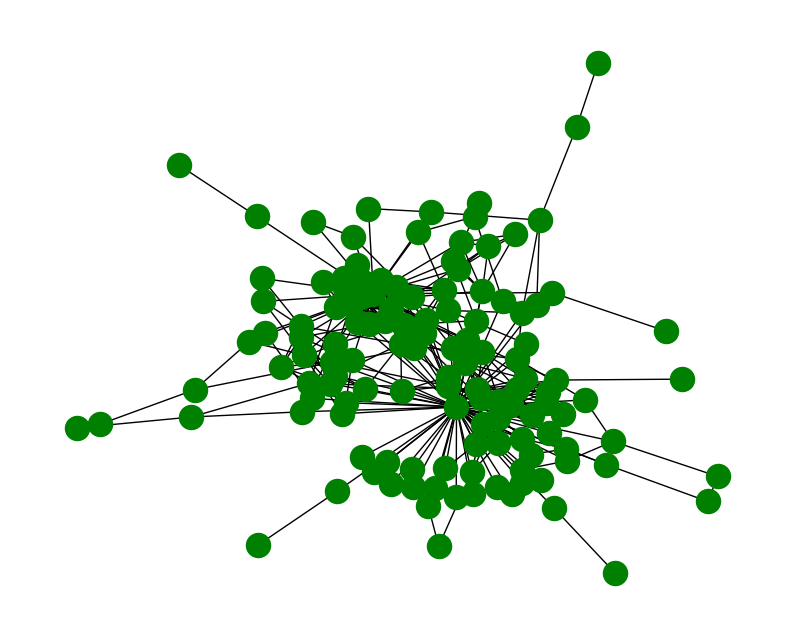

In [46]:
#visualization using spring_layot
layout = nx.spring_layout(H)
nx.draw_networkx(H, pos=layout, node_color='green', with_labels=False)
_ = plt.axis('off')

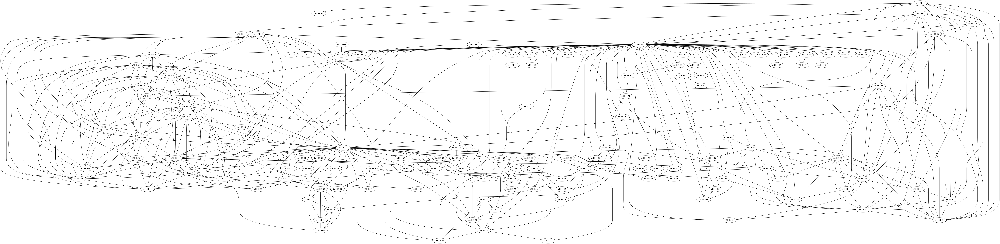

In [54]:
#visualization using pydot rendering 
pydot(H)

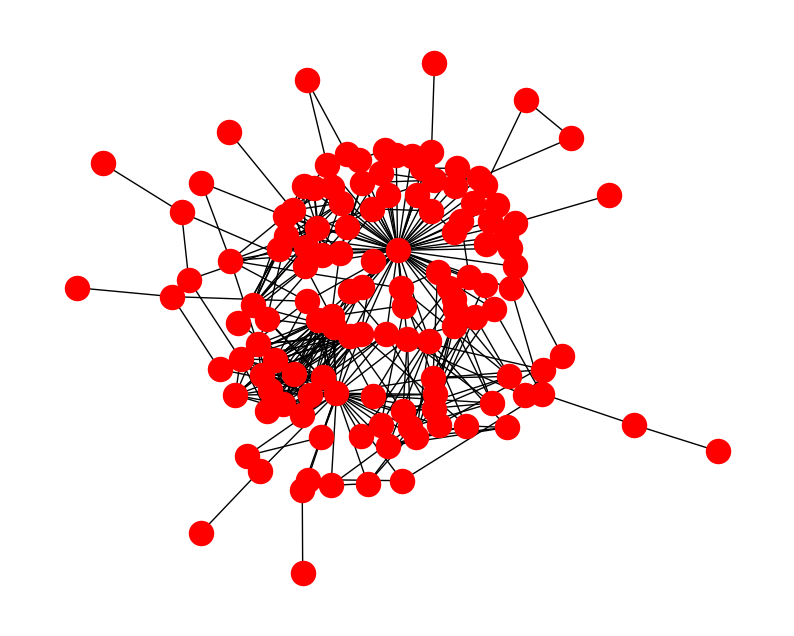

In [53]:
#visualization using neato
nx.draw_networkx(H, pos=graphviz_layout(H,prog='neato'), node_color='red', with_labels=False)
_ = plt.axis('off')

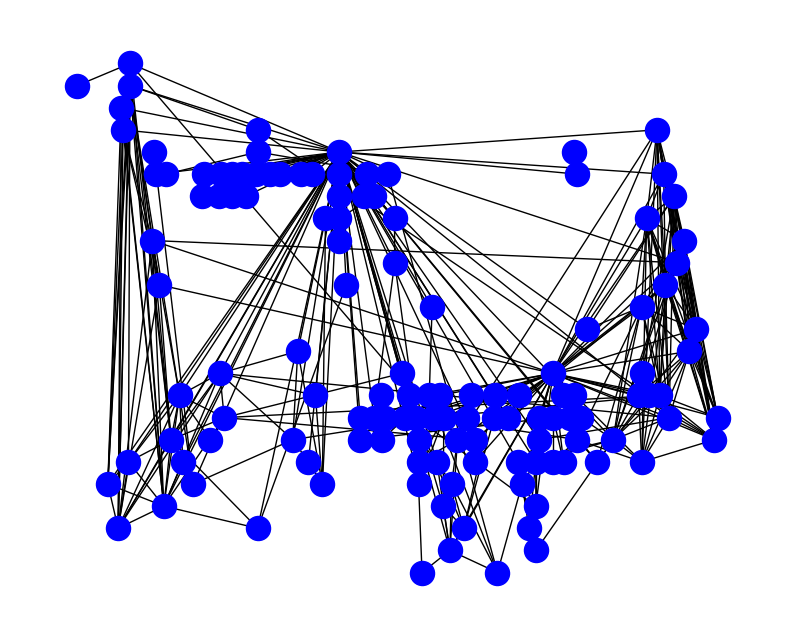

In [50]:
nx.draw_networkx(H, pos=graphviz_layout(H, prog="dot"), node_color='blue', with_labels=False)
_ = plt.axis('off')

Node fa10-01-04 has 67 interactions.
Node fa10-01-13 has 42 interactions.
Node sp10-01-49 has 17 interactions.
Node sp10-01-41 has 16 interactions.
Node sp10-01-31 has 16 interactions.
Node sp10-01-38 has 15 interactions.
Node sp10-01-39 has 15 interactions.
Node fa10-01-82 has 15 interactions.
Node sp10-01-08 has 14 interactions.
Node sp10-01-46 has 14 interactions.


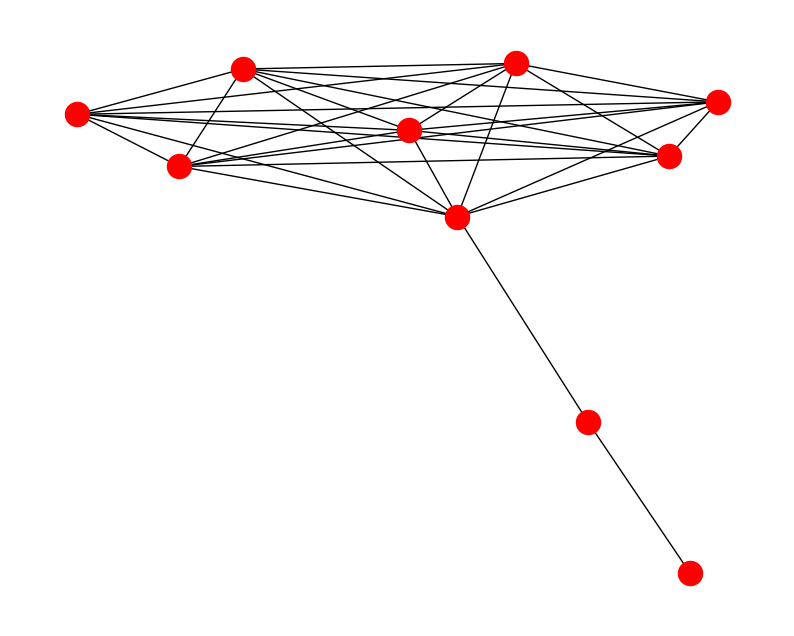

In [55]:
import networkx as nx

# Calculate node degrees
node_degrees = dict(H.degree())

# Sort nodes by degree in descending order and get the top 10 nodes
top_nodes = sorted(node_degrees.items(), key=lambda x: x[1], reverse=True)[:10]

# Print the top 10 nodes and their degrees
for node, degree in top_nodes:
    print(f"Node {node} has {degree} interactions.")

# If you want to visualize these top nodes in the graph, you can create a subgraph
top_nodes_list = [node for node, _ in top_nodes]
top_subgraph = H.subgraph(top_nodes_list)

# Visualize the subgraph with top nodes using the same layout
layout = nx.spring_layout(top_subgraph)
nx.draw_networkx(top_subgraph, pos=layout, node_color='red', with_labels=False)
_ = plt.axis('off')
plt.show()


Node fa10-01-04 has 67 interactions.
Node fa10-01-13 has 42 interactions.
Node sp10-01-49 has 17 interactions.
Node sp10-01-31 has 16 interactions.
Node sp10-01-41 has 16 interactions.
Node fa10-01-82 has 15 interactions.
Node sp10-01-38 has 15 interactions.
Node sp10-01-39 has 15 interactions.
Node sp10-01-45 has 14 interactions.
Node sp10-01-08 has 14 interactions.


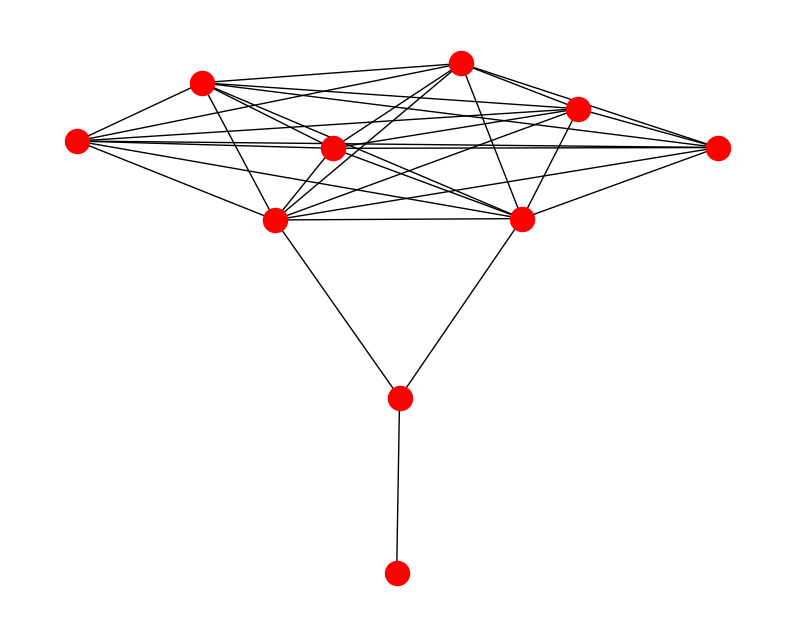

In [56]:
import networkx as nx

# Calculate node degrees
node_degrees = dict(G.degree())

# Sort nodes by degree in descending order and get the top 10 nodes
top_nodes = sorted(node_degrees.items(), key=lambda x: x[1], reverse=True)[:10]

# Print the top 10 nodes and their degrees
for node, degree in top_nodes:
    print(f"Node {node} has {degree} interactions.")

# If you want to visualize these top nodes in the graph, you can create a subgraph
top_nodes_list = [node for node, _ in top_nodes]
top_subgraph = G.subgraph(top_nodes_list)

# Visualize the subgraph with top nodes using the same layout
layout = nx.spring_layout(top_subgraph)
nx.draw_networkx(top_subgraph, pos=layout, node_color='red', with_labels=False)
_ = plt.axis('off')
plt.show()


In [57]:
import networkx as nx

# Assuming you have already loaded your graph G

# Specify the node for which you want to find the count of interactions
specific_node = "fa10-01-04"

# Use the degree method to find the count of interactions for the specific node
interaction_count = G.degree(specific_node)

print(f"The count of interactions for node {specific_node} is {interaction_count}.")


The count of interactions for node fa10-01-04 is 67.


In [58]:
import networkx as nx

# Assuming you have already loaded your graph G

# Specify the node for which you want to find the count of interactions
specific_node = "fa10-01-04"

# Use the degree method to find the count of interactions for the specific node
interaction_count = H.degree(specific_node)

print(f"The count of interactions for node {specific_node} is {interaction_count}.")


The count of interactions for node fa10-01-04 is 67.


<br>
<div class="alert alert-info">
<b>Exercise 3 End.</b>
</div>

> **Exercise complete**:
    
> This is a good time to "Save and Checkpoint".